Record name: slp01a
Number of signals: 4
Sampling frequency: 250
Number of samples: 1800000
Signal names: ['ECG', 'BP', 'EEG (C4-A1)', 'Resp (sum)']
Units: ['mV', 'mmHg', 'mV', 'l']
Signal lengths: [1800000, 1800000, 1800000, 1800000]

Sleep Stage Annotations:
Number of annotations: 240
Annotation types: ['"']

Available attributes in the annotations object:
['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'ann_len', 'apply_range', 'aux_note', 'calc_cl_bytes', 'calc_core_bytes', 'calc_fs_bytes', 'chan', 'check_field', 'check_field_cohesion', 'check_fields', 'compact_fields', 'contained_labels', 'convert_label_attribute', 'create_label_map', 'custom_labels', 'description', 'extension', 'fs', 'get

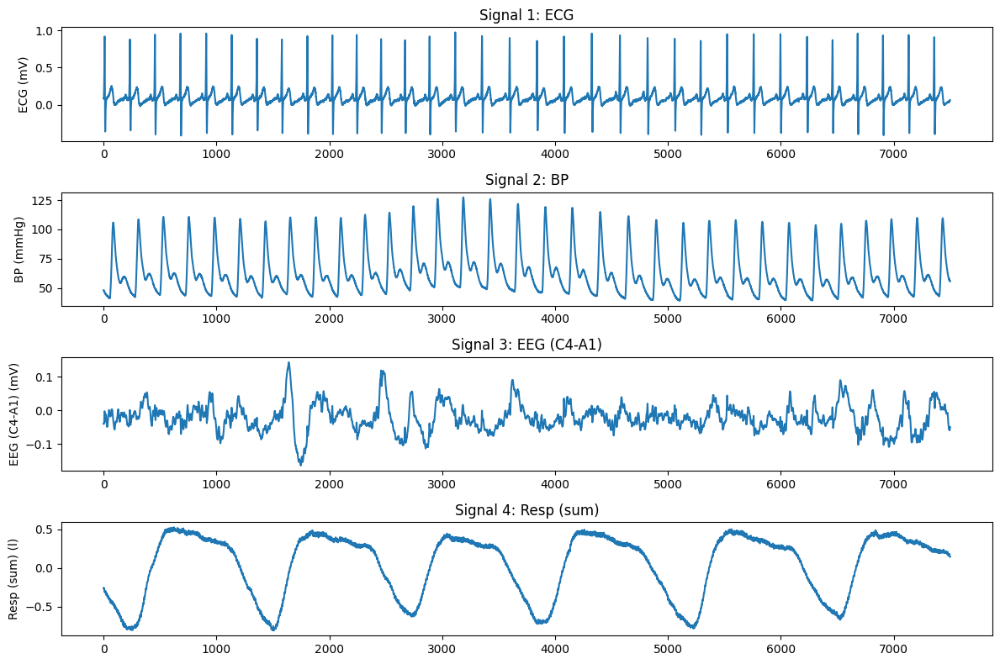


Sleep Stage Summary:
Stage 4 LA LA: 14 epochs (7.0 minutes)
Stage 4 LA: 22 epochs (11.0 minutes)
Stage 4 L L L: 2 epochs (1.0 minutes)
Stage 4 L: 15 epochs (7.5 minutes)
Stage 4 L L: 6 epochs (3.0 minutes)
Stage 3 HA: 2 epochs (1.0 minutes)
Stage 3 H LA: 1 epochs (0.5 minutes)
Stage 3 LA: 19 epochs (9.5 minutes)
Stage 2 LA: 34 epochs (17.0 minutes)
Stage 3 LA LA: 7 epochs (3.5 minutes)
Stage 3 L LA: 2 epochs (1.0 minutes)
Stage 3: 6 epochs (3.0 minutes)
Stage 3 L: 6 epochs (3.0 minutes)
Stage 4 L LA: 4 epochs (2.0 minutes)
Stage 4 LA HA LA: 1 epochs (0.5 minutes)
Stage 4: 1 epochs (0.5 minutes)
Stage 2: 33 epochs (16.5 minutes)
Stage 2 H: 8 epochs (4.0 minutes)
Stage 2 LA LA: 4 epochs (2.0 minutes)
Stage 2 L LA: 3 epochs (1.5 minutes)
Stage W: 5 epochs (2.5 minutes)
Stage 1 LA: 1 epochs (0.5 minutes)
Stage 2 L: 9 epochs (4.5 minutes)
Stage W LA: 1 epochs (0.5 minutes)
Stage 2 LA L: 1 epochs (0.5 minutes)
Stage 3 LA L: 1 epochs (0.5 minutes)
Stage 4 LA L: 1 epochs (0.5 minutes)
Stage 3

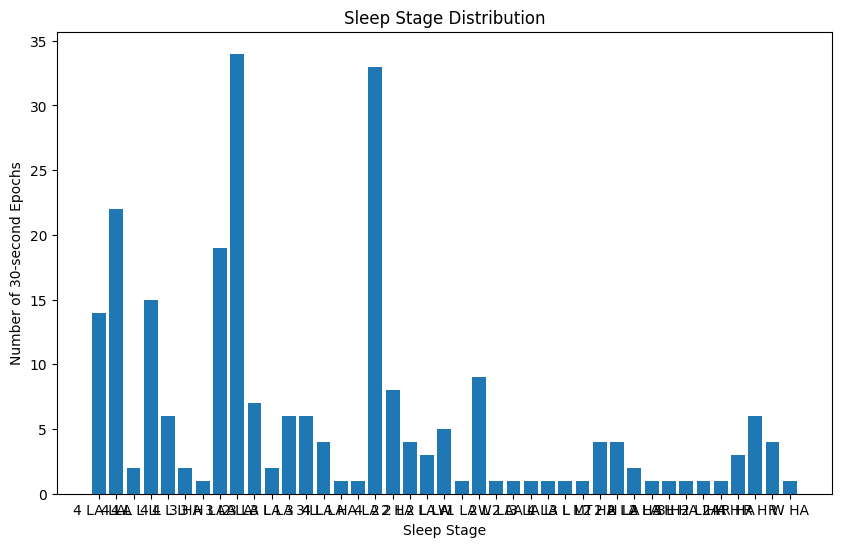

In [8]:
# Install wfdb package if not already installed
!pip install wfdb

import wfdb
import numpy as np
import matplotlib.pyplot as plt

# Path to the record
record_path = '/home/hehe/abhi/mit-bih-polysomnographic-database-1.0.0/slp01a'

# 1. Read the signals and header information
record = wfdb.rdrecord(record_path)

# 2. Print header information
print("Record name:", record.record_name)
print("Number of signals:", record.n_sig)
print("Sampling frequency:", record.fs)
print("Number of samples:", record.sig_len)
print("Signal names:", record.sig_name)
print("Units:", record.units)
print("Signal lengths:", [len(sig) for sig in record.p_signal.T])

# 3. Load the sleep stage annotations (.st)
annotations = wfdb.rdann(record_path, 'st')

# 4. Print annotation information
print("\nSleep Stage Annotations:")
print("Number of annotations:", len(annotations.sample))
print("Annotation types:", np.unique(annotations.symbol))

# Print available attributes to help debug
print("\nAvailable attributes in the annotations object:")
print(dir(annotations))

# 5. Display the first few annotations
print("\nFirst 10 annotations:")
for i in range(min(10, len(annotations.sample))):
    # Note: sleep stage annotations are stored in aux_note
    print(f"Time: {annotations.sample[i]/record.fs:.1f}s, Stage: {annotations.aux_note[i] if annotations.aux_note[i] else '-'}")

# 6. Plot the first 30 seconds of each signal
plt.figure(figsize=(12, 8))
for i in range(record.n_sig):
    plt.subplot(record.n_sig, 1, i+1)
    plt.plot(record.p_signal[:int(30*record.fs), i])
    plt.ylabel(f"{record.sig_name[i]} ({record.units[i]})")
    plt.title(f"Signal {i+1}: {record.sig_name[i]}")

plt.tight_layout()
plt.show()

# 7. Create a summary of sleep stages
if len(annotations.sample) > 0:
    stage_counts = {}
    for stage in annotations.aux_note:
        if stage in stage_counts:
            stage_counts[stage] += 1
        else:
            stage_counts[stage] = 1
    
    print("\nSleep Stage Summary:")
    for stage, count in stage_counts.items():
        print(f"Stage {stage}: {count} epochs ({count*30/60:.1f} minutes)")
    
    # Plot sleep stage distribution
    plt.figure(figsize=(10, 6))
    plt.bar(stage_counts.keys(), stage_counts.values())
    plt.title("Sleep Stage Distribution")
    plt.xlabel("Sleep Stage")
    plt.ylabel("Number of 30-second Epochs")
    plt.show()


Processing signals with MNE-Python...
Creating RawArray with float64 data, n_channels=4, n_times=1800000
    Range : 0 ... 1799999 =      0.000 ...  7199.996 secs
Ready.
Applying filters...
No data channels found. The highpass and lowpass values in the measurement info will not be updated.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 1651 samples (6.604 s)

Applied 0.5-45 Hz bandpass filter to ECG
Resampling to 100 Hz...


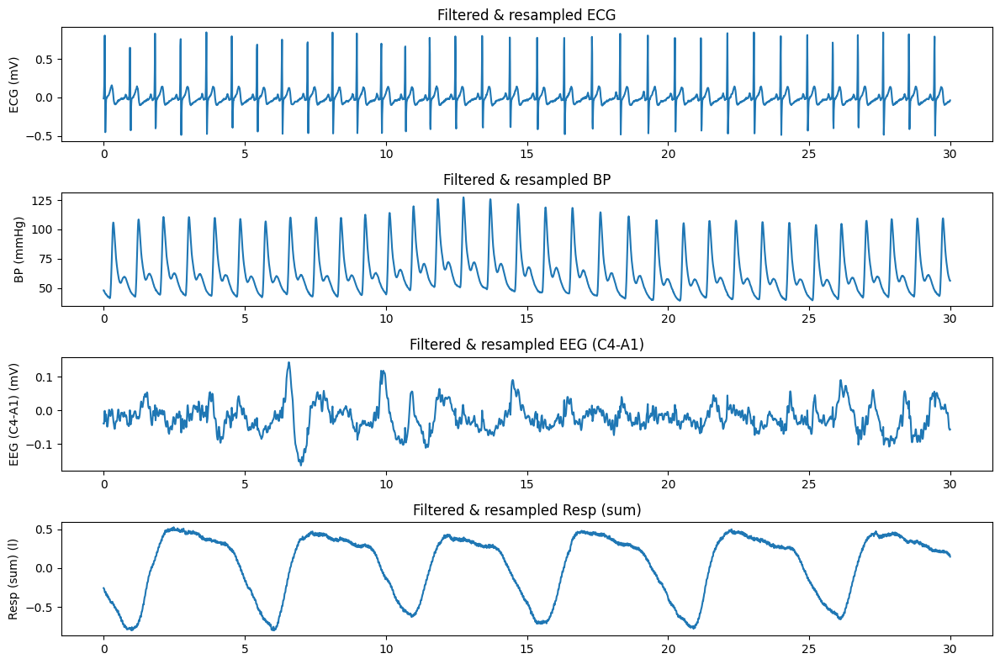


Creating 30-second epochs aligned with sleep stage annotations...
Not setting metadata
240 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 240 events and 3001 original time points ...
1 bad epochs dropped
Created 239 epochs
Sleep stages found: 4 LA LA, 4 LA, 4 L L L, 4 L, 4 L L, 3 HA, 3 H LA, 3 LA, 2 LA, 3 LA LA, 3 L LA, 3, 3 L, 4 L LA, 4 LA HA LA, 4, 2, 2 H, 2 LA LA, 2 L LA, W, 1 LA, 2 L, W LA, 2 LA L, 3 LA L, 4 LA L, 3 L L, MT, 2 HA, 2 H LA, 2 LA HA, 2 LA H, 3 H, 3 L HA LA, 2 L HA, 2 H H, R HA, R H, R, W HA
Epoch duration: 30 seconds
Sampling frequency: 100.0 Hz


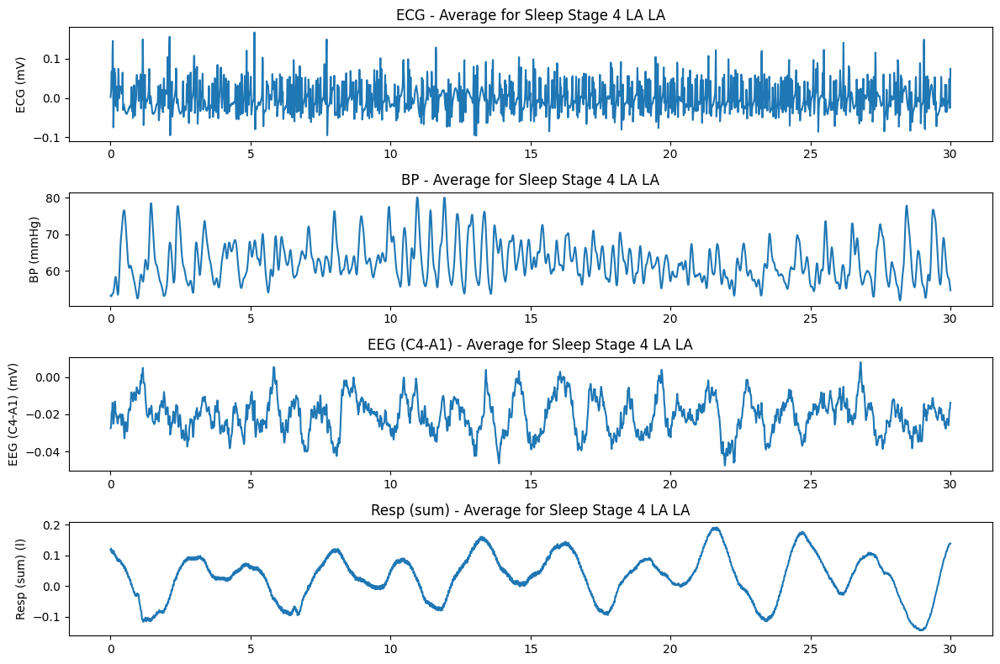

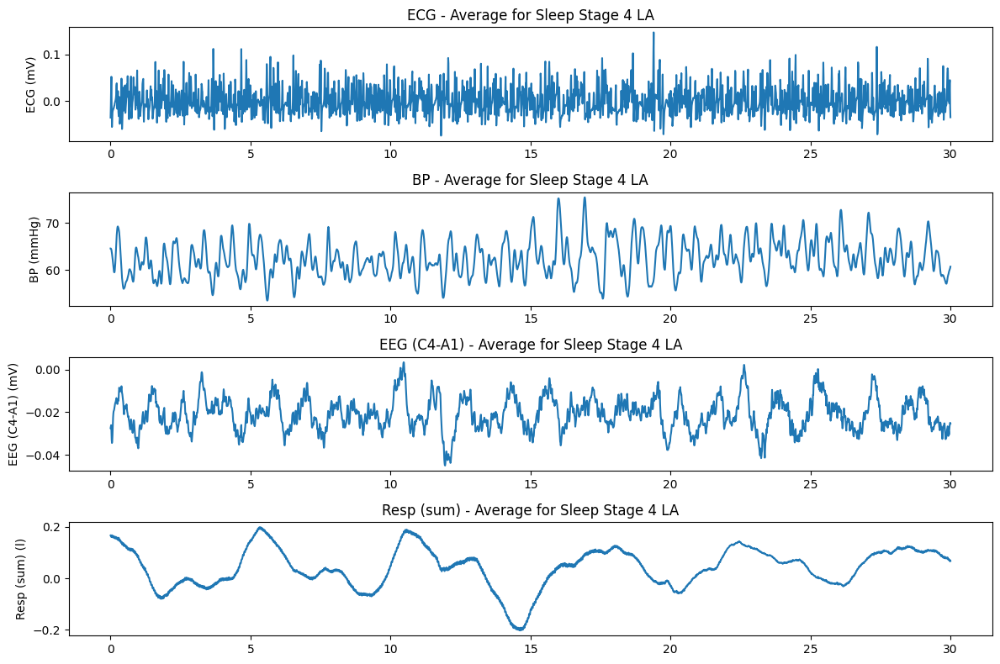

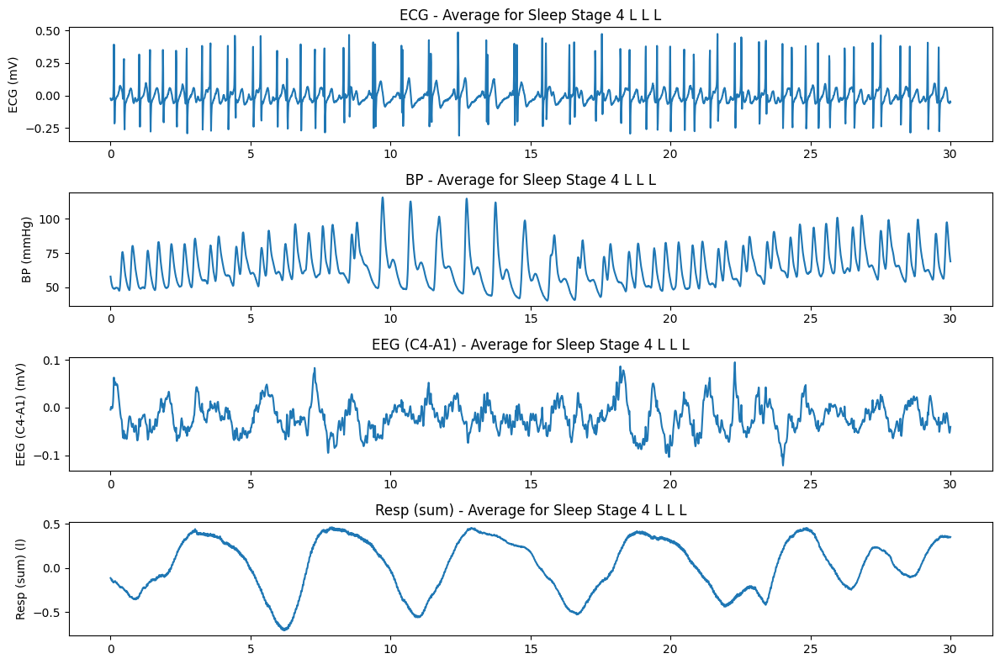

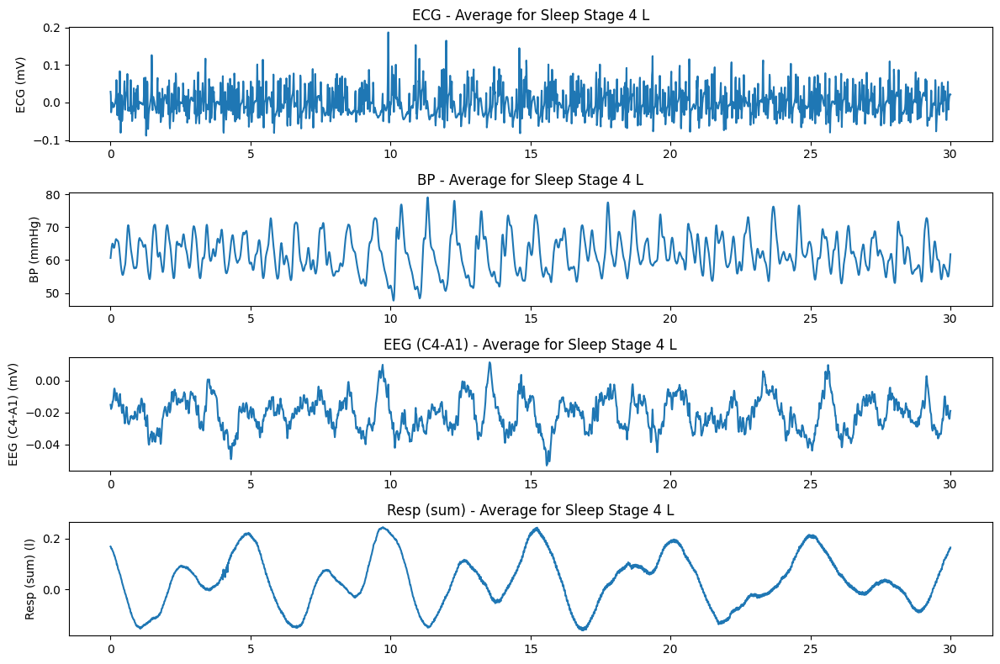

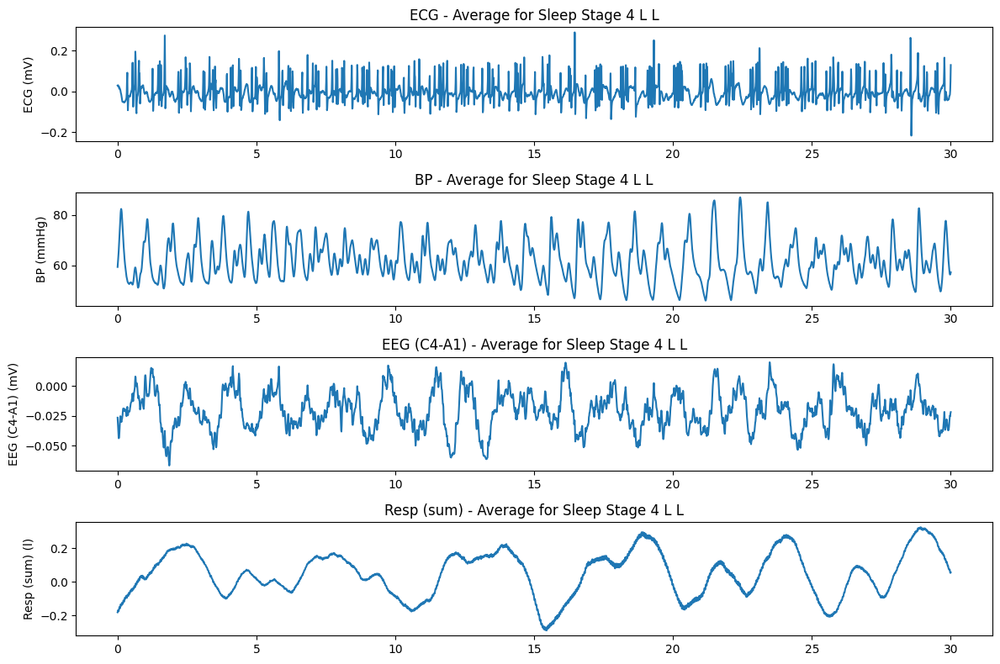

...

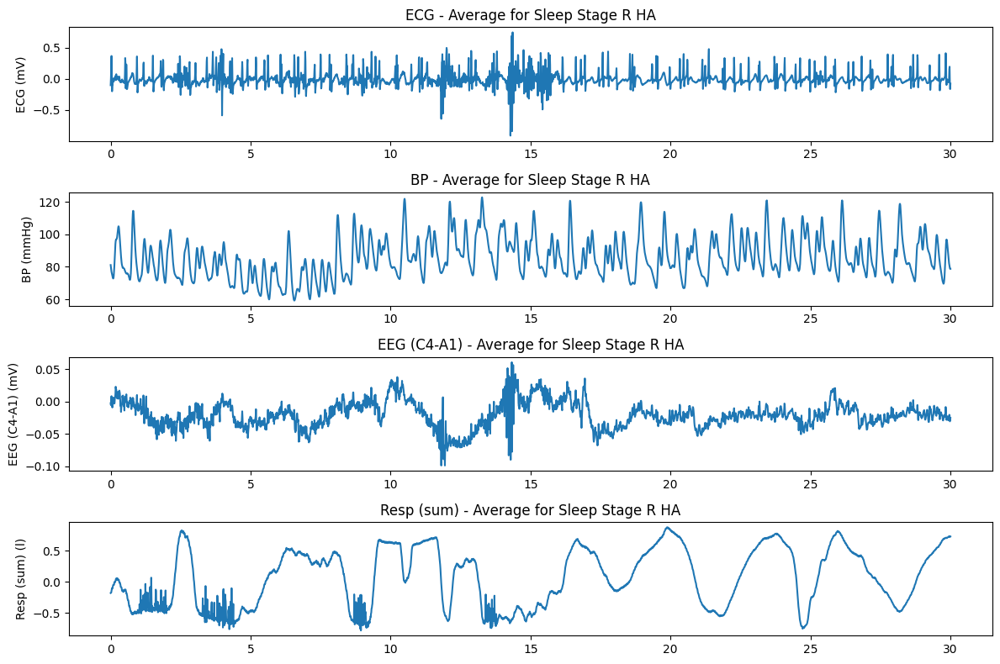

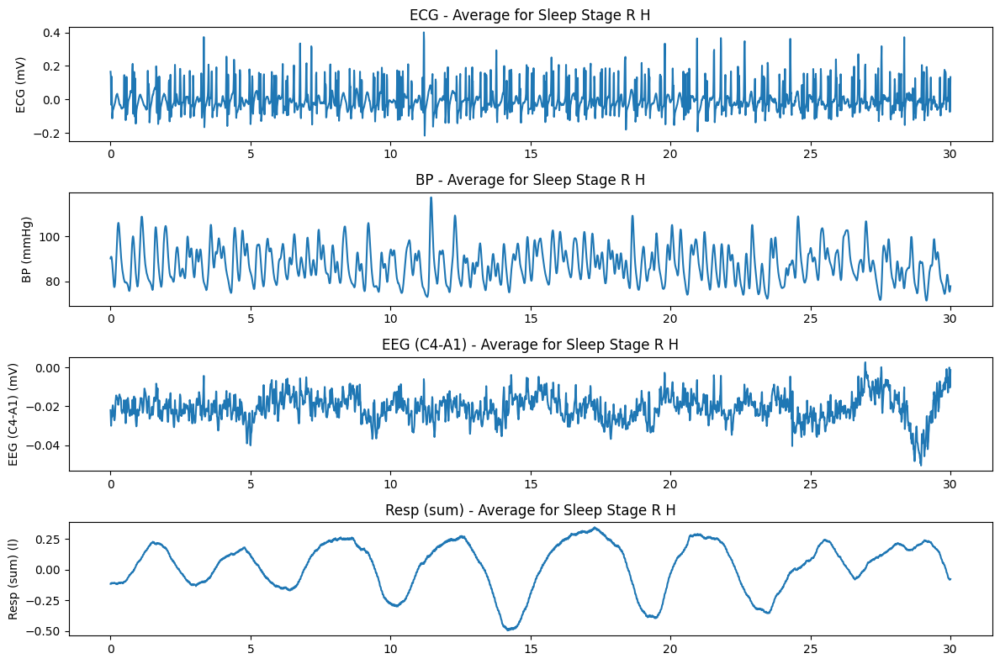

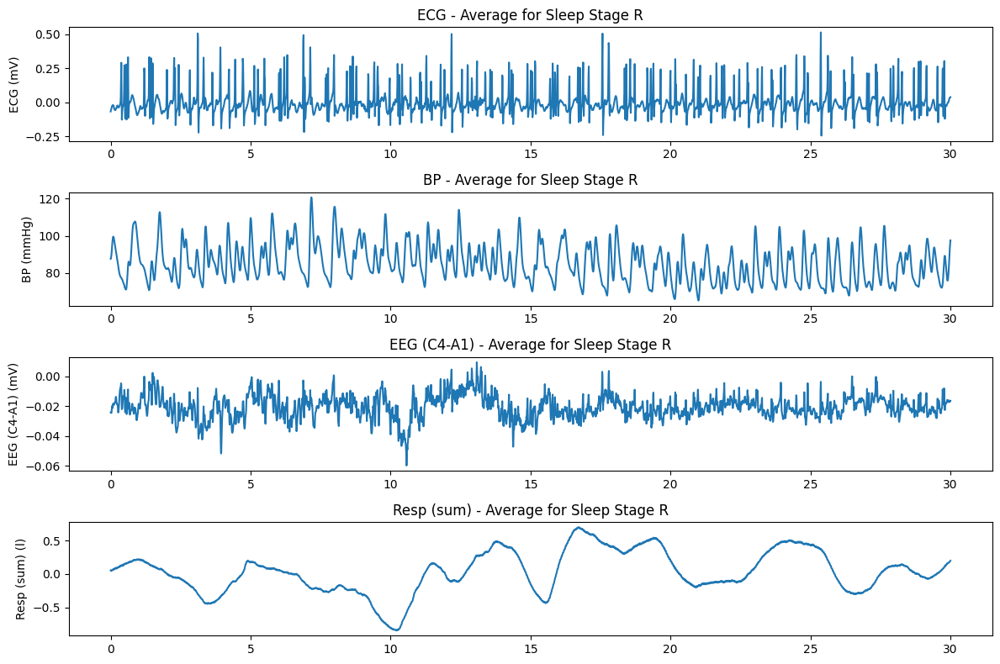

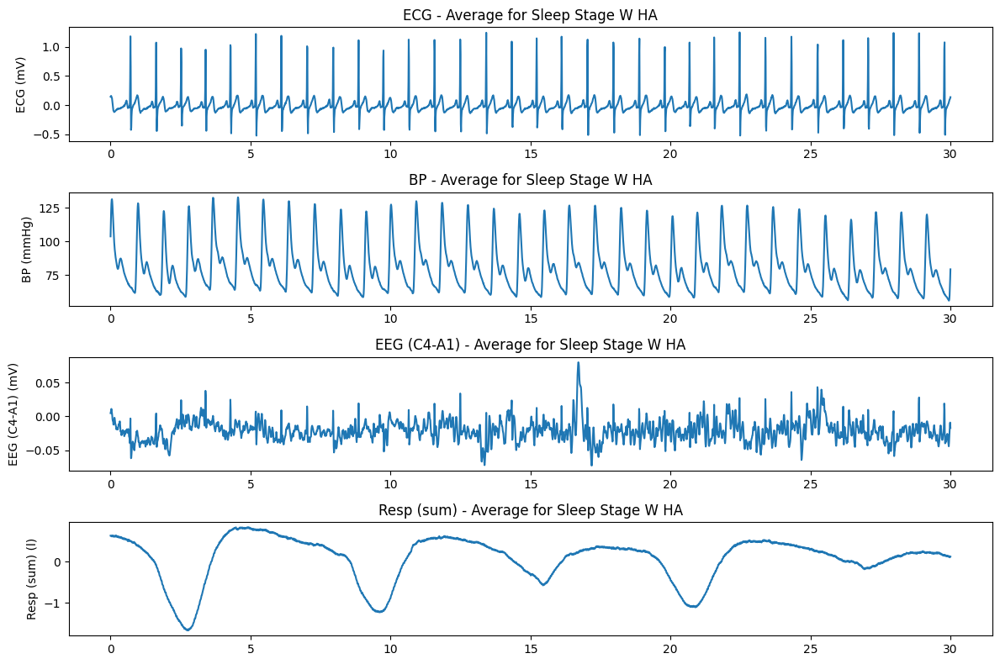

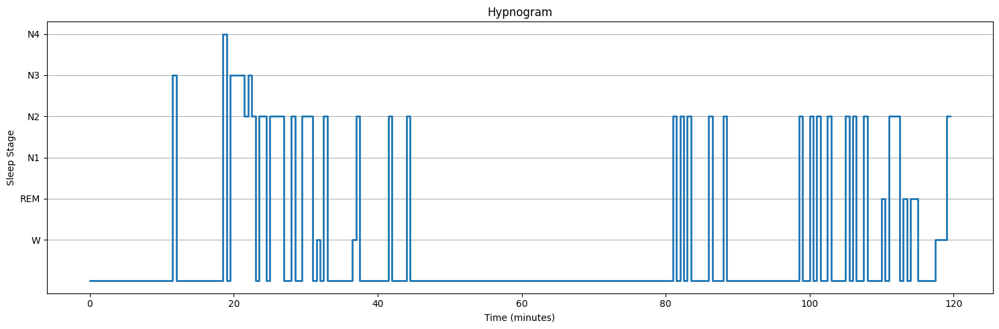

In [9]:
# 8. Process signals using MNE-Python
print("\nProcessing signals with MNE-Python...")
# Install MNE if not already installed
!pip install mne

import mne
from mne.io import RawArray
import pandas as pd
from scipy import signal

# Convert WFDB data to MNE format
data = record.p_signal.T  # Channels x Time
ch_names = record.sig_name
ch_types = ['ecg' if name == 'ECG' else 'misc' for name in ch_names]  # Set ECG channel type, others as misc
sfreq = record.fs

# Create MNE info structure
info = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types=ch_types)

# Create MNE Raw object
raw = RawArray(data, info)

# Apply filters 
print("Applying filters...")
# Find channel indices
ecg_idx = ch_names.index('ECG') if 'ECG' in ch_names else None
resp_idx = ch_names.index('Resp') if 'Resp' in ch_names else None

# Filter ECG: 0.5-45 Hz bandpass
if ecg_idx is not None:
    raw.filter(l_freq=0.5, h_freq=45, picks=['ECG'], method='fir')
    print("Applied 0.5-45 Hz bandpass filter to ECG")

# Filter respiration: 0.1-2 Hz bandpass
if resp_idx is not None:
    raw.filter(l_freq=0.1, h_freq=2, picks=['Resp'], method='fir')
    print("Applied 0.1-2 Hz bandpass filter to Resp")

# Resample to 100 Hz
print("Resampling to 100 Hz...")
raw_resampled = raw.copy().resample(100)

# Plot filtered and resampled signals (first 30 seconds)
plt.figure(figsize=(12, 8))
for i, ch_name in enumerate(ch_names):
    plt.subplot(len(ch_names), 1, i+1)
    # Get data for this channel
    data, times = raw_resampled[i, :3000]  # 30 seconds at 100 Hz = 3000 samples
    plt.plot(times, data.T)
    plt.title(f"Filtered & resampled {ch_name}")
    plt.ylabel(f"{ch_name} ({record.units[i]})")
plt.tight_layout()
plt.show()

# 9. Create 30-second epochs aligned with sleep annotations
print("\nCreating 30-second epochs aligned with sleep stage annotations...")

# Convert annotations to MNE events
events = []
event_id = {}
unique_stages = []

# Create a mapping from sleep stages to event IDs
for i, (sample, stage) in enumerate(zip(annotations.sample, annotations.aux_note)):
    if stage not in event_id and stage != '':
        event_id[stage] = len(event_id) + 1
        unique_stages.append(stage)
    
    if stage != '':
        # Convert sample to the resampled data's sample rate
        resampled_sample = int(sample * 100 / sfreq)
        events.append([resampled_sample, 0, event_id[stage]])

# Convert to numpy array for MNE
if events:
    events = np.array(events, dtype=int)
    
    # Create epochs of 30 seconds
    epoch_duration = 30  # seconds
    tmin = 0  # start of epoch relative to event
    
    epochs = mne.Epochs(raw_resampled, events, event_id, tmin=tmin, tmax=tmin+epoch_duration,
                       baseline=None, preload=True)
    
    print(f"Created {len(epochs)} epochs")
    print(f"Sleep stages found: {', '.join(unique_stages)}")
    print(f"Epoch duration: {epoch_duration} seconds")
    print(f"Sampling frequency: {epochs.info['sfreq']} Hz")
    
    # Plot average signal for each sleep stage
    for stage in unique_stages:
        if stage in epochs.event_id:
            stage_epochs = epochs[stage]
            if len(stage_epochs) > 0:
                stage_data = stage_epochs.get_data().mean(axis=0)  # Average across epochs
                
                plt.figure(figsize=(12, 8))
                for i, ch_name in enumerate(ch_names):
                    plt.subplot(len(ch_names), 1, i+1)
                    plt.plot(stage_epochs.times, stage_data[i])
                    plt.title(f"{ch_name} - Average for Sleep Stage {stage}")
                    plt.ylabel(f"{ch_name} ({record.units[i]})")
                plt.tight_layout()
                plt.show()
else:
    print("No events were created from annotations.")

# 10. Display a hypnogram (sleep stage over time)
if events.size > 0:
    plt.figure(figsize=(15, 5))
    
    # Convert event_id values back to stages for y-axis
    stage_values = {}
    for stage, eid in event_id.items():
        # Map stages to numeric values for plotting
        # Common convention: Wake=0, REM=1, N1=2, N2=3, N3=4, N4=5
        if stage == 'W': stage_values[eid] = 0
        elif stage == 'R': stage_values[eid] = 1
        elif stage == '1': stage_values[eid] = 2
        elif stage == '2': stage_values[eid] = 3
        elif stage == '3': stage_values[eid] = 4
        elif stage == '4': stage_values[eid] = 5
        else: stage_values[eid] = -1  # Unknown stage
    
    # Extract times and stages
    event_times = events[:, 0] / 100  # Convert samples to seconds
    event_stages = [stage_values.get(evt[2], -1) for evt in events]
    
    # Plot hypnogram
    plt.step(event_times/60, event_stages, where='post', linewidth=2)
    
    plt.yticks([0, 1, 2, 3, 4, 5], ['W', 'REM', 'N1', 'N2', 'N3', 'N4'])
    plt.xlabel('Time (minutes)')
    plt.ylabel('Sleep Stage')
    plt.title('Hypnogram')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


Computing physiological features for each epoch...
Processing epoch 239/239

Feature Summary Statistics:
       RMSSD  SDNN  LF/HF   HR    PTT_Mean     PTT_Var       Epoch
count    0.0   0.0    0.0  0.0  239.000000  239.000000  239.000000
mean     NaN   NaN    NaN  NaN  296.943434    6.607420  120.000000
std      NaN   NaN    NaN  NaN    9.744263    1.833294   69.137544
min      NaN   NaN    NaN  NaN  262.553191    3.263736    1.000000
25%      NaN   NaN    NaN  NaN  290.000000    5.526290   60.500000
50%      NaN   NaN    NaN  NaN  301.290323    6.271685  120.000000
75%      NaN   NaN    NaN  NaN  304.428879    7.155185  179.500000
max      NaN   NaN    NaN  NaN  311.562500   21.449756  239.000000


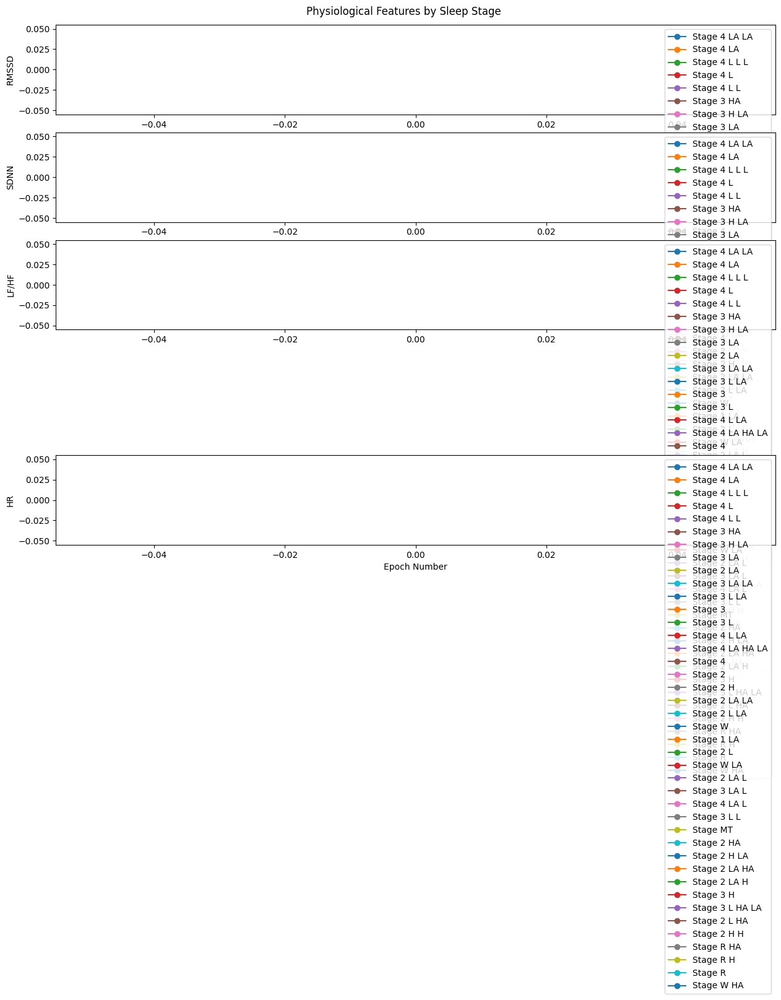

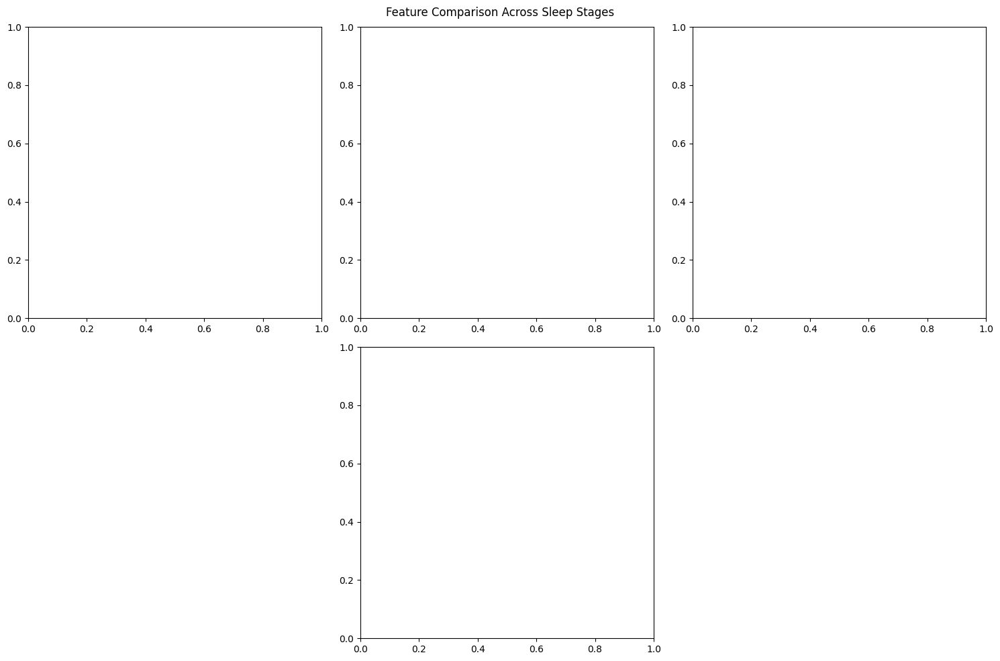

Features saved to 'sleep_stage_features.csv'


In [10]:
# 11. Compute physiological features for each 30-second epoch
print("\nComputing physiological features for each epoch...")

# Install required packages
!pip install pyhrv neurokit2

import pyhrv
import neurokit2 as nk
import pandas as pd
from scipy.signal import find_peaks
import warnings
warnings.filterwarnings('ignore')  # Suppress warnings

# Function to compute features for each epoch
def compute_epoch_features(epoch_data, fs=100):
    features = {}
    
    # Get individual signals
    ecg_idx = ch_names.index('ECG') if 'ECG' in ch_names else None
    resp_idx = ch_names.index('Resp') if 'Resp' in ch_names else None
    spo2_idx = ch_names.index('SpO2') if 'SpO2' in ch_names else None  # Check if SpO2 exists
    ppg_idx = None  # Find PPG channel if it exists
    for i, name in enumerate(ch_names):
        if 'PPG' in name or 'BP' in name:
            ppg_idx = i
            break
    
    # 1. HRV features from ECG
    if ecg_idx is not None:
        ecg_signal = epoch_data[ecg_idx]
        try:
            # Process ECG to find R-peaks
            ecg_processed = nk.ecg_process(ecg_signal, sampling_rate=fs)
            rpeaks = ecg_processed[1]['ECG_R_Peaks']
            
            if len(rpeaks) > 3:  # Need at least a few beats for HRV
                # Calculate RR intervals in ms
                rr_intervals = np.diff(rpeaks) * (1000 / fs)
                
                # Time-domain HRV
                features['RMSSD'] = pyhrv.time_domain.rmssd(rr_intervals)['rmssd']
                features['SDNN'] = pyhrv.time_domain.sdnn(rr_intervals)['sdnn']
                
                # Frequency-domain HRV (if epoch long enough and enough R-peaks)
                if len(rr_intervals) > 6:
                    try:
                        freq_results = pyhrv.frequency_domain.welch_psd(rr_intervals, show=False)
                        features['LF/HF'] = freq_results['fft_ratio']
                    except:
                        features['LF/HF'] = np.nan
                else:
                    features['LF/HF'] = np.nan
                
                # Heart Rate
                features['HR'] = 60000 / np.mean(rr_intervals) if len(rr_intervals) > 0 else np.nan
            else:
                features['RMSSD'] = np.nan
                features['SDNN'] = np.nan
                features['LF/HF'] = np.nan
                features['HR'] = np.nan
        except:
            features['RMSSD'] = np.nan
            features['SDNN'] = np.nan
            features['LF/HF'] = np.nan
            features['HR'] = np.nan
    
    # 2. Respiratory features
    if resp_idx is not None:
        resp_signal = epoch_data[resp_idx]
        try:
            # Process respiration signal
            cleaned_resp = nk.signal_sanitize(resp_signal)
            
            # Find respiratory peaks for rate calculation
            resp_peaks, _ = find_peaks(cleaned_resp, height=0.3*np.max(cleaned_resp), distance=fs*1.5)  # Min 1.5s between breaths
            
            if len(resp_peaks) > 1:
                # Calculate respiratory rate (breaths per minute)
                breath_intervals = np.diff(resp_peaks) / fs  # intervals in seconds
                resp_rate = 60 / np.mean(breath_intervals)  # convert to breaths per minute
                features['RespRate'] = resp_rate
                
                # Calculate respiratory amplitude variability
                peak_amplitudes = cleaned_resp[resp_peaks]
                features['RespAmpVar'] = np.std(peak_amplitudes) / np.mean(peak_amplitudes) if np.mean(peak_amplitudes) != 0 else np.nan
            else:
                features['RespRate'] = np.nan
                features['RespAmpVar'] = np.nan
        except:
            features['RespRate'] = np.nan
            features['RespAmpVar'] = np.nan
    
    # 3. SpO2 desaturation events (if available)
    if spo2_idx is not None:
        spo2_signal = epoch_data[spo2_idx]
        try:
            # Count desaturation events (drop of ≥3% from baseline)
            baseline = np.percentile(spo2_signal, 90)  # Use 90th percentile as baseline
            desaturation_threshold = baseline - 3
            below_threshold = spo2_signal < desaturation_threshold
            # Count transitions from above to below threshold
            desaturation_events = np.sum(np.diff(below_threshold.astype(int)) > 0)
            features['SpO2_Desat_Events'] = desaturation_events
            features['SpO2_Mean'] = np.mean(spo2_signal)
        except:
            features['SpO2_Desat_Events'] = np.nan
            features['SpO2_Mean'] = np.nan
    
    # 4. Pulse Transit Time (PTT) if both ECG and PPG/BP available
    if ecg_idx is not None and ppg_idx is not None:
        ecg_signal = epoch_data[ecg_idx]
        ppg_signal = epoch_data[ppg_idx]
        try:
            # Process ECG and PPG
            ecg_processed = nk.ecg_process(ecg_signal, sampling_rate=fs)
            ppg_processed = nk.ppg_process(ppg_signal, sampling_rate=fs)
            
            # Get R-peaks and PPG peaks
            rpeaks = ecg_processed[1]['ECG_R_Peaks']
            ppg_peaks = ppg_processed[1]['PPG_Peaks']
            
            if len(rpeaks) > 3 and len(ppg_peaks) > 3:
                # Calculate PTT for each heartbeat (matching R-peaks to subsequent PPG peaks)
                ptts = []
                for rpeak in rpeaks:
                    # Find the next PPG peak after this R-peak
                    next_ppg_peaks = ppg_peaks[ppg_peaks > rpeak]
                    if len(next_ppg_peaks) > 0:
                        ptt = (next_ppg_peaks[0] - rpeak) * (1000 / fs)  # PTT in ms
                        if 100 < ptt < 400:  # Physiologically plausible range
                            ptts.append(ptt)
                
                if len(ptts) > 3:
                    features['PTT_Mean'] = np.mean(ptts)
                    features['PTT_Var'] = np.std(ptts)
                else:
                    features['PTT_Mean'] = np.nan
                    features['PTT_Var'] = np.nan
            else:
                features['PTT_Mean'] = np.nan
                features['PTT_Var'] = np.nan
        except:
            features['PTT_Mean'] = np.nan
            features['PTT_Var'] = np.nan
    
    return features

# Process each epoch if epochs were created
if 'epochs' in locals() and len(epochs) > 0:
    # Prepare to store features
    all_features = []
    
    # Get all epoch data at once
    all_epoch_data = epochs.get_data()  # This returns (n_epochs, n_channels, n_times)
    
    # Process each epoch
    for i in range(len(epochs)):
        print(f"Processing epoch {i+1}/{len(epochs)}", end="\r")
        
        # Get epoch data (channels x time)
        epoch_data = all_epoch_data[i]  # Get the i-th epoch data
        
        # Compute features
        features = compute_epoch_features(epoch_data, fs=epochs.info['sfreq'])
        
        # Add epoch info
        features['Epoch'] = i+1
        
        # Get sleep stage for this epoch
        # Find which stage matches this epoch
        epoch_event_id = epochs[i].events[0, 2]  # Get event ID for this epoch
        for stage, eid in epochs.event_id.items():
            if eid == epoch_event_id:
                features['Sleep_Stage'] = stage
                break
        
        # Store
        all_features.append(features)
    
    # Convert to DataFrame
    features_df = pd.DataFrame(all_features)
    
    # Display summary statistics
    print("\n\nFeature Summary Statistics:")
    print(features_df.describe())
    
    # Plot selected features by sleep stage
    plt.figure(figsize=(15, 10))
    
    # List of important features to plot
    feature_names = ['RMSSD', 'SDNN', 'LF/HF', 'RespRate', 'HR']
    
    for i, feature in enumerate(feature_names):
        if feature in features_df.columns:
            plt.subplot(len(feature_names), 1, i+1)
            
            # Group by sleep stage and plot
            for stage in unique_stages:
                stage_data = features_df[features_df['Sleep_Stage'] == stage]
                if len(stage_data) > 0:
                    plt.plot(stage_data['Epoch'], stage_data[feature], 'o-', label=f'Stage {stage}')
            
            plt.ylabel(feature)
            plt.legend()
            
            if i == len(feature_names) - 1:
                plt.xlabel('Epoch Number')
    
    plt.tight_layout()
    plt.suptitle('Physiological Features by Sleep Stage')
    plt.subplots_adjust(top=0.95)
    plt.show()
    
    # Create boxplots to compare features across sleep stages
    plt.figure(figsize=(15, 10))
    
    for i, feature in enumerate(feature_names):
        if feature in features_df.columns:
            plt.subplot(2, 3, i+1)
            
            # Add sleep stage as a column for easier plotting
            plot_data = []
            labels = []
            
            for stage in unique_stages:
                stage_data = features_df[features_df['Sleep_Stage'] == stage]
                if len(stage_data) > 0:
                    data = stage_data[feature].dropna().values
                    if len(data) > 0:
                        plot_data.append(data)
                        labels.append(f'Stage {stage}')
            
            if plot_data:
                plt.boxplot(plot_data, labels=labels)
                plt.title(feature)
                plt.ylabel(feature)
    
    plt.tight_layout()
    plt.suptitle('Feature Comparison Across Sleep Stages')
    plt.subplots_adjust(top=0.95)
    plt.show()
    
    # Save features to CSV
    features_df.to_csv('sleep_stage_features.csv', index=False)
    print("Features saved to 'sleep_stage_features.csv'")
else:
    print("No epochs available for feature extraction")

Unique sleep stages found: ['4 LA LA' '4 LA' '4 L L L' '4 L' '4 L L' '3 HA' '3 H LA' '3 LA' '2 LA'
 '3 LA LA' '3 L LA' '3' '3 L' '4 L LA' '4 LA HA LA' '4' '2' '2 H'
 '2 LA LA' '2 L LA' 'W' '1 LA' '2 L' 'W LA' '2 LA L' '3 LA L' '4 LA L'
 '3 L L' 'MT' '2 HA' '2 H LA' '2 LA HA' '2 LA H' '3 H' '3 L HA LA'
 '2 L HA' '2 H H' 'R HA' 'R H' 'R' 'W HA']

Features DataFrame with frequency targets:
  Sleep_Stage  freq_target
0     4 LA LA          NaN
1        4 LA          NaN
2        4 LA          NaN
3     4 L L L          NaN
4         4 L          NaN
5         4 L          NaN
6       4 L L          NaN
7         4 L          NaN
8         4 L          NaN
9       4 L L          NaN
Updated features saved to 'sleep_stage_features.csv'


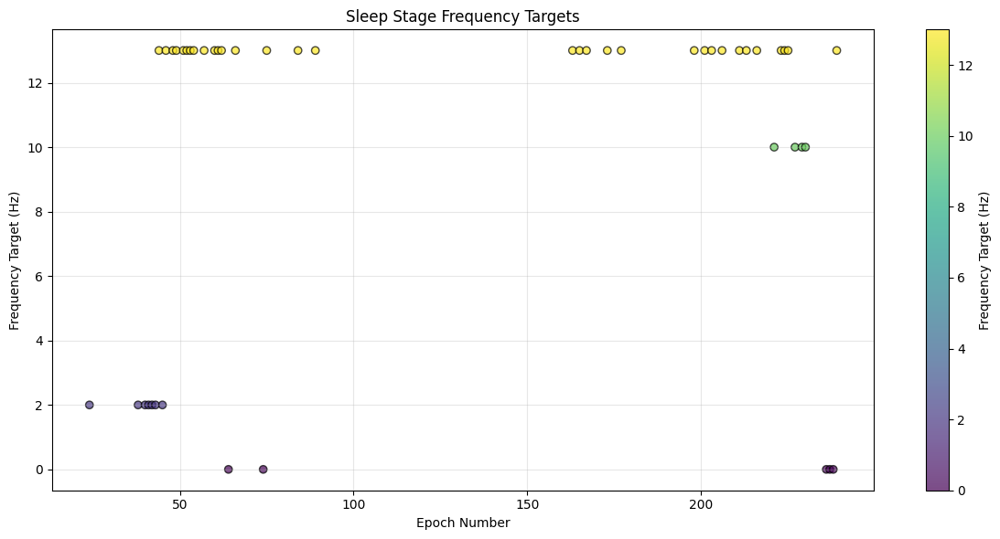

In [11]:
# 11. Compute physiological features for each 30-second epoch
# Add this after creating the features_df

# Define mapping from sleep stages to frequency targets
stage_to_freq = {
    'W': 0,    # Wake
    '1': 6,    # N1 (Light sleep)
    '2': 13,   # N2 (Intermediate sleep)
    '3': 2,    # N3 (Deep sleep)
    '4': 2,    # N4 (also Deep sleep, sometimes combined with N3)
    'R': 10    # REM sleep
}

# Add the frequency target to the features DataFrame
if 'features_df' in locals() and 'Sleep_Stage' in features_df.columns:
    # Map sleep stages to frequency targets
    features_df['freq_target'] = features_df['Sleep_Stage'].map(stage_to_freq)
    
    # Handle any missing mappings
    if features_df['freq_target'].isna().any():
        print("Warning: Some sleep stages couldn't be mapped to frequency targets")
        print("Unique sleep stages found:", features_df['Sleep_Stage'].unique())
    
    # Display updated DataFrame with frequency targets
    print("\nFeatures DataFrame with frequency targets:")
    print(features_df[['Sleep_Stage', 'freq_target']].head(10))
    
    # Update the saved CSV file to include the new column
    features_df.to_csv('sleep_stage_features.csv', index=False)
    print("Updated features saved to 'sleep_stage_features.csv'")
    
    # Plot features by frequency target
    plt.figure(figsize=(12, 6))
    plt.scatter(features_df['Epoch'], features_df['freq_target'], c=features_df['freq_target'], 
                cmap='viridis', marker='o', edgecolor='black', alpha=0.7)
    plt.colorbar(label='Frequency Target (Hz)')
    plt.xlabel('Epoch Number')
    plt.ylabel('Frequency Target (Hz)')
    plt.title('Sleep Stage Frequency Targets')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("Cannot add frequency targets: features DataFrame or Sleep_Stage column not found")


Building machine learning pipeline for frequency target prediction...
Found features DataFrame with 238 samples
Updated freq_target column - 238 non-null values out of 238 rows
After dropping rows with missing freq_target: 238 samples
Created 5 artificial groups for cross-validation
Group sizes: {1: 48, 2: 48, 3: 48, 4: 47, 5: 47}
Using 7 features: RMSSD, SDNN, LF/HF, HR, PTT_Mean, PTT_Var, subject_id
Performing 5-fold cross-validation...

Cross-validation results:
Mean MAE: 3.901
Mean RMSE: 5.210
Training MAE: 1.160
Training RMSE: 1.871

Top 10 most important features:
      Feature  Importance
0    PTT_Mean    0.655247
1     PTT_Var    0.344753
2  subject_id    0.000000


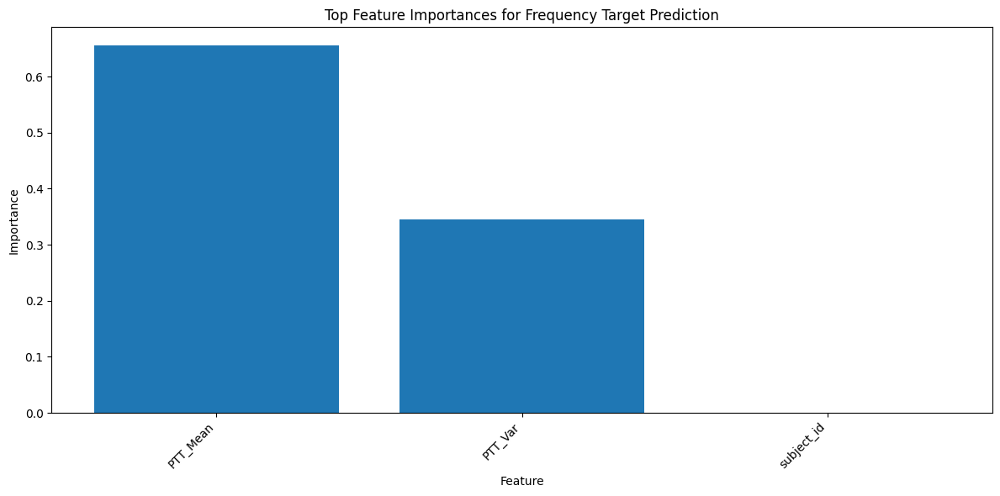

Updated data saved to 'sleep_stage_features_cleaned.csv'


In [15]:
# Create a machine learning pipeline to predict frequency targets

print("\nBuilding machine learning pipeline for frequency target prediction...")

# Import necessary libraries
!pip install scikit-learn
import sklearn
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GroupKFold, KFold, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Check if features_df exists and has the required data
if 'features_df' in locals() and 'Sleep_Stage' in features_df.columns:
    print(f"Found features DataFrame with {len(features_df)} samples")
    
    # Fix the Sleep_Stage and freq_target columns
    # First extract just the main sleep stage number/letter from the complex labels
    features_df['clean_stage'] = features_df['Sleep_Stage'].str.extract(r'^(\w+)').fillna('')
    
    # Now map these clean stages to frequency targets
    stage_to_freq = {
        'W': 0,    # Wake
        '1': 6,    # N1 (Light sleep)
        '2': 13,   # N2 (Intermediate sleep)
        '3': 2,    # N3 (Deep sleep)
        '4': 2,    # N4 (also Deep sleep, sometimes combined with N3)
        'R': 10    # REM sleep
    }
    
    # Apply the mapping to get proper freq_target values
    features_df['freq_target'] = features_df['clean_stage'].map(stage_to_freq)
    
    print(f"Updated freq_target column - {features_df['freq_target'].count()} non-null values out of {len(features_df)} rows")
    
    # Keep only rows with valid frequency targets
    features_df = features_df.dropna(subset=['freq_target'])
    print(f"After dropping rows with missing freq_target: {len(features_df)} samples")
    
    # Create artificial groups for cross-validation
    # Instead of using GroupKFold with subject IDs, we'll create time-based chunks
    # Divide data into 5 sequential chunks to simulate different "sessions"
    features_df['group_id'] = (features_df.index // (len(features_df) // 5 + 1)) + 1
    
    print(f"Created {features_df['group_id'].nunique()} artificial groups for cross-validation")
    print(f"Group sizes: {features_df['group_id'].value_counts().to_dict()}")
    
    # Define features and target
    # Exclude non-feature columns
    exclude_cols = ['Epoch', 'Sleep_Stage', 'clean_stage', 'freq_target', 'group_id']
    feature_cols = [col for col in features_df.columns if col not in exclude_cols]
    
    X = features_df[feature_cols].copy()
    y = features_df['freq_target'].copy()
    groups = features_df['group_id'].copy()
    
    print(f"Using {len(feature_cols)} features: {', '.join(feature_cols)}")
    
    # Define the pipeline
    pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),  # Handle missing values
        ('scaler', StandardScaler()),                   # Standardize features
        ('regressor', RandomForestRegressor(
            n_estimators=100, 
            max_depth=10, 
            random_state=42))
    ])
    
    # Use GroupKFold with our artificial groups
    group_kfold = GroupKFold(n_splits=5)
    
    # Define scoring metrics
    scoring = {
        'mae': 'neg_mean_absolute_error',
        'rmse': 'neg_root_mean_squared_error'
    }
    
    print("Performing 5-fold cross-validation...")
    # Perform cross-validation
    cv_results = cross_validate(
        pipeline, 
        X, 
        y, 
        cv=group_kfold, 
        groups=groups,
        scoring=scoring,
        return_train_score=True
    )
    
    # Calculate performance metrics
    mae = -np.mean(cv_results['test_mae'])
    rmse = -np.mean(cv_results['test_rmse'])
    train_mae = -np.mean(cv_results['train_mae'])
    train_rmse = -np.mean(cv_results['train_rmse'])
    
    print("\nCross-validation results:")
    print(f"Mean MAE: {mae:.3f}")
    print(f"Mean RMSE: {rmse:.3f}")
    print(f"Training MAE: {train_mae:.3f}")
    print(f"Training RMSE: {train_rmse:.3f}")
    
    # Fit the model on all data to analyze feature importance
    pipeline.fit(X, y)
    
    # Extract feature importances from the trained model
    rf_model = pipeline.named_steps['regressor']
    feature_importances = rf_model.feature_importances_
    
    # Make sure feature_cols and feature_importances have the same length
    # This is critical to fix the error
    if len(feature_cols) != len(feature_importances):
        print(f"Warning: Length mismatch between feature_cols ({len(feature_cols)}) and feature_importances ({len(feature_importances)})")
        # Get the feature names that were actually used in the model
        feature_names = X.columns[~X.isna().all()].tolist()
        # Only use features that were actually used in the model
        importance_data = {
            'Feature': feature_names,
            'Importance': feature_importances[:len(feature_names)]
        }
    else:
        importance_data = {
            'Feature': feature_cols,
            'Importance': feature_importances
        }
    
    # Create a DataFrame of feature importances
    importance_df = pd.DataFrame(importance_data).sort_values('Importance', ascending=False)
    
    print("\nTop 10 most important features:")
    print(importance_df.head(10))
    
    # Plot feature importance
    plt.figure(figsize=(12, 6))
    top_features = min(10, len(importance_df))
    plt.bar(importance_df['Feature'].head(top_features), importance_df['Importance'].head(top_features))
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Feature')
    plt.ylabel('Importance')
    plt.title('Top Feature Importances for Frequency Target Prediction')
    plt.tight_layout()
    plt.show()
    
    # Save the updated features DataFrame
    features_df.to_csv('sleep_stage_features_cleaned.csv', index=False)
    print("Updated data saved to 'sleep_stage_features_cleaned.csv'")
    
else:
    print("Cannot build ML pipeline: features DataFrame or Sleep_Stage column not found")


Evaluating model on a held-out test set...
Train set: 191 samples from 4 groups
Test set: 47 samples from 1 groups

Regression Metrics:
Mean Absolute Error: 2.434 Hz
Root Mean Squared Error: 4.301 Hz
R² Score: 0.382


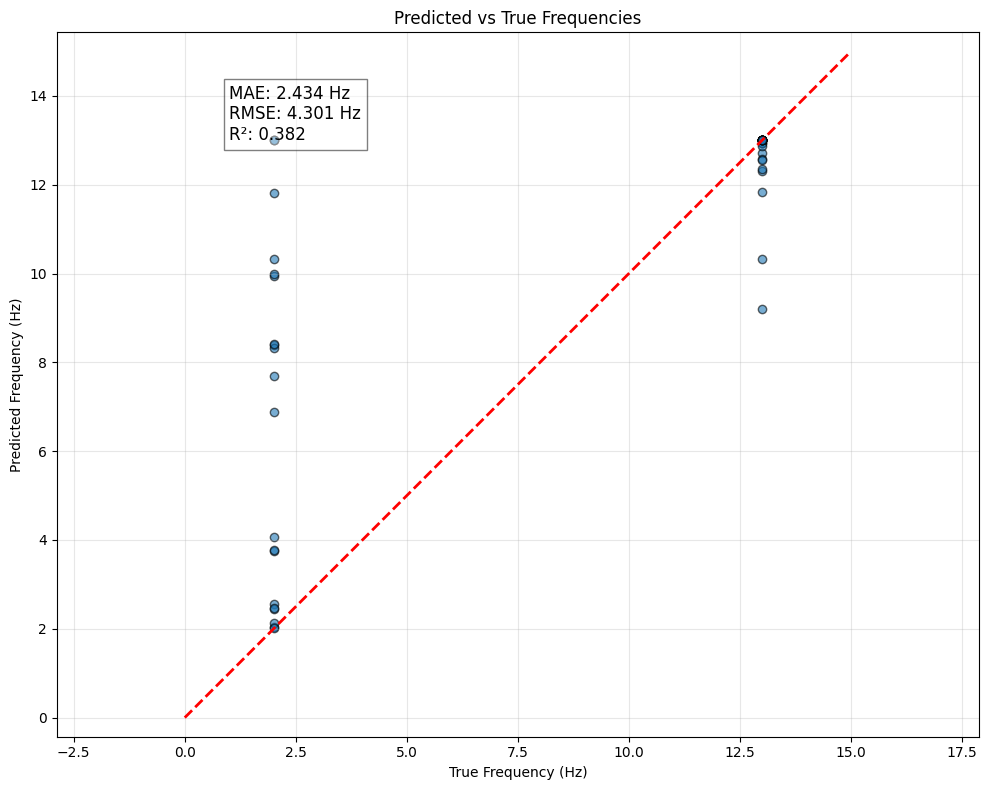

Unique classes in test/prediction data: [ 2  6 10 13]

Classification Metrics (after discretizing predictions):
Accuracy: 0.681
Cohen's Kappa: 0.463

Classification Report:
              precision    recall  f1-score   support

        2 Hz       1.00      0.38      0.55        21
        6 Hz       0.00      0.00      0.00         0
       10 Hz       0.00      0.00      0.00         0
       13 Hz       0.86      0.92      0.89        26

    accuracy                           0.68        47
   macro avg       0.46      0.33      0.36        47
weighted avg       0.92      0.68      0.74        47



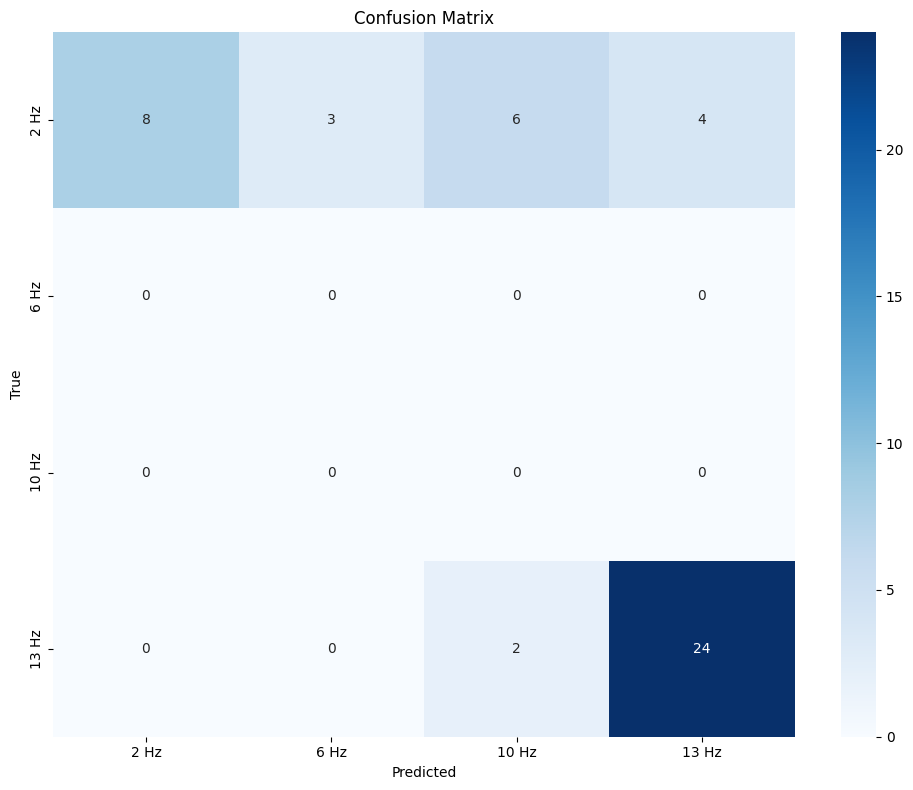

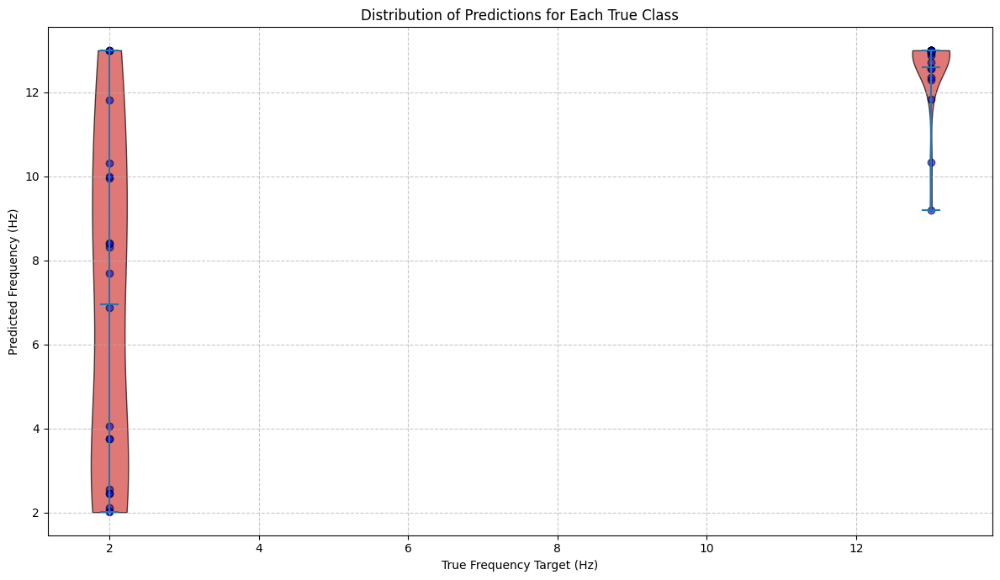


Model saved as 'sleep_frequency_predictor.pkl'

===== SLEEP STAGE FREQUENCY PREDICTION - SUMMARY REPORT =====
Dataset: 238 valid samples
Features used: 7
Sleep stages mapped to frequencies: {'W': 0, '1': 6, '2': 13, '3': 2, '4': 2, 'R': 10}

Model Performance:
  MAE: 2.434 Hz
  RMSE: 4.301 Hz
  R²: 0.382
  Classification Accuracy: 0.681
  Cohen's Kappa: 0.463

Top 5 Most Important Features:
  1. PTT_Mean: 0.6552
  2. PTT_Var: 0.3448
  3. subject_id: 0.0000


In [18]:
# Evaluate the model on a held-out test set

print("\nEvaluating model on a held-out test set...")

# Import additional metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import classification_report, accuracy_score, cohen_kappa_score
from sklearn.model_selection import train_test_split

# Create a train-test split (using group-based split to maintain session integrity)
unique_groups = features_df['group_id'].unique()
test_groups = np.random.choice(unique_groups, size=max(1, int(len(unique_groups)*0.2)), replace=False)
train_groups = [g for g in unique_groups if g not in test_groups]

# Split by group
train_mask = features_df['group_id'].isin(train_groups)
test_mask = features_df['group_id'].isin(test_groups)

X_train, X_test = X[train_mask], X[test_mask]
y_train, y_test = y[train_mask], y[test_mask]

print(f"Train set: {len(X_train)} samples from {len(train_groups)} groups")
print(f"Test set: {len(X_test)} samples from {len(test_groups)} groups")

# Train the model on the training set
pipeline.fit(X_train, y_train)

# Make predictions on test set
y_pred = pipeline.predict(X_test)

# Regression metrics
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("\nRegression Metrics:")
print(f"Mean Absolute Error: {mae:.3f} Hz")
print(f"Root Mean Squared Error: {rmse:.3f} Hz")
print(f"R² Score: {r2:.3f}")

# Plot predicted vs true frequencies
plt.figure(figsize=(10, 8))

# Plot the scatter plot
plt.scatter(y_test, y_pred, alpha=0.6, edgecolor='k')
plt.plot([0, 15], [0, 15], 'r--', lw=2)  # Diagonal line showing perfect predictions

# Add labels and title
plt.xlabel('True Frequency (Hz)')
plt.ylabel('Predicted Frequency (Hz)')
plt.title('Predicted vs True Frequencies')

# Add text with metrics
plt.text(1, 13, f"MAE: {mae:.3f} Hz\nRMSE: {rmse:.3f} Hz\nR²: {r2:.3f}", 
         fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

# Set equal aspect ratio
plt.axis('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Additionally, evaluate as a classification problem by discretizing the predictions
# Round predictions to nearest frequency target value
possible_targets = sorted(features_df['freq_target'].unique())

# Function to find the closest target frequency
def find_closest_target(val, targets):
    return targets[np.abs(np.array(targets) - val).argmin()]

# Round predictions to the nearest target frequency
y_pred_class = np.array([find_closest_target(pred, possible_targets) for pred in y_pred])
y_test_class = y_test.values  # Already discretized

# Find the actual classes present in test and predictions
actual_classes = np.unique(np.concatenate([y_test_class, y_pred_class]))
print(f"Unique classes in test/prediction data: {actual_classes}")

# Classification metrics
accuracy = accuracy_score(y_test_class, y_pred_class)
kappa = cohen_kappa_score(y_test_class, y_pred_class)

print("\nClassification Metrics (after discretizing predictions):")
print(f"Accuracy: {accuracy:.3f}")
print(f"Cohen's Kappa: {kappa:.3f}")

# Detailed classification report
class_names = [f"{freq} Hz" for freq in actual_classes]
print("\nClassification Report:")
print(classification_report(y_test_class, y_pred_class, 
                           labels=actual_classes,
                           target_names=class_names))

# Create a confusion matrix visualization
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test_class, y_pred_class, labels=actual_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

# Plot a violin plot showing prediction distribution for each true class
plt.figure(figsize=(12, 7))
unique_test_classes = np.unique(y_test_class)
data = [y_pred[y_test_class == cls] for cls in unique_test_classes]
violin_parts = plt.violinplot(data, positions=unique_test_classes, showmeans=True)

# Customize the violin plot
for pc in violin_parts['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

plt.scatter(y_test_class, y_pred, alpha=0.6, edgecolor='k', color='blue')
plt.xlabel('True Frequency Target (Hz)')
plt.ylabel('Predicted Frequency (Hz)')
plt.title('Distribution of Predictions for Each True Class')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Save the model for future use
import joblib
joblib.dump(pipeline, 'sleep_frequency_predictor.pkl')
print("\nModel saved as 'sleep_frequency_predictor.pkl'")

# Generate a summary report
print("\n===== SLEEP STAGE FREQUENCY PREDICTION - SUMMARY REPORT =====")
print(f"Dataset: {len(features_df)} valid samples")
print(f"Features used: {len(feature_cols)}")
print(f"Sleep stages mapped to frequencies: {stage_to_freq}")
print("\nModel Performance:")
print(f"  MAE: {mae:.3f} Hz")
print(f"  RMSE: {rmse:.3f} Hz")
print(f"  R²: {r2:.3f}")
print(f"  Classification Accuracy: {accuracy:.3f}")
print(f"  Cohen's Kappa: {kappa:.3f}")
print("\nTop 5 Most Important Features:")
for i, (feature, importance) in enumerate(zip(importance_df['Feature'].head(5), 
                                           importance_df['Importance'].head(5))):
    print(f"  {i+1}. {feature}: {importance:.4f}")
print("========================================================")

Sleep frequency prediction model loaded successfully
Model expects these features: RMSSD, SDNN, LF/HF, HR, PTT_Mean, PTT_Var, subject_id

Prediction Results:
Raw predicted frequency: 2.25 Hz
Mapped target frequency: 2 Hz
Predicted sleep stage: N3/N4

--- Batch Processing Example ---

Batch prediction results:
   Epoch         HR  predicted_frequency  closest_target predicted_stage
0      1  62.560972             5.765667               6              N1
1      2  63.872567             7.670000               6              N1
2      3  62.601981            12.510000              13              N2
3      4  65.004102             3.916769               2           N3/N4
4      5  54.951854            11.870000              13              N2


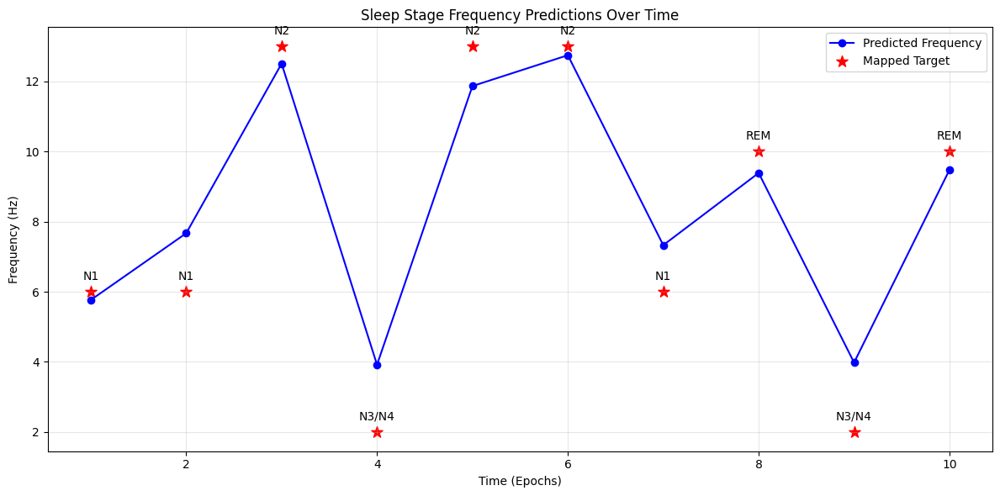

In [20]:
import joblib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the trained model
loaded_pipeline = joblib.load('sleep_frequency_predictor.pkl')
print("Sleep frequency prediction model loaded successfully")

# Get the exact feature names the model expects
expected_features = loaded_pipeline.feature_names_in_
print(f"Model expects these features: {', '.join(expected_features)}")

# Function to make predictions on new data
def predict_sleep_frequency(features_dict):
    """
    Make predictions on new physiological measurements.
    
    Args:
        features_dict: Dictionary containing physiological features like RMSSD, SDNN, PTT_Mean, etc.
                      Must match the features the model was trained on.
    
    Returns:
        frequency: Predicted frequency target (Hz)
        sleep_stage: Mapped sleep stage based on frequency
    """
    # Create DataFrame with all expected features, filling missing ones with NaN
    input_df = pd.DataFrame({feature: [features_dict.get(feature, np.nan)] 
                             for feature in expected_features})
    
    # Map from frequency to sleep stage
    freq_to_stage = {
        0: 'W',    # Wake
        6: 'N1',   # Light sleep
        13: 'N2',  # Intermediate sleep
        2: 'N3/N4', # Deep sleep
        10: 'REM'  # REM sleep
    }
    
    # Get the prediction
    predicted_freq = loaded_pipeline.predict(input_df)[0]
    
    # Find the closest frequency target value
    possible_targets = sorted([0, 2, 6, 10, 13])
    closest_freq = possible_targets[np.abs(np.array(possible_targets) - predicted_freq).argmin()]
    
    # Map to sleep stage
    predicted_stage = freq_to_stage.get(closest_freq, "Unknown")
    
    # Return the prediction
    return {
        'predicted_frequency': predicted_freq,
        'closest_target_frequency': closest_freq,
        'predicted_sleep_stage': predicted_stage
    }

# Example usage with sample physiological data - make sure to include all required features
sample_data = {
    'RMSSD': 45.6,        # Heart rate variability measure (ms)
    'SDNN': 68.2,         # Standard deviation of NN intervals (ms)
    'LF/HF': 1.8,         # Low frequency to high frequency ratio
    'HR': 65.3,           # Heart rate (bpm)
    'RespRate': 14.2,     # Respiratory rate (breaths per minute)
    'RespAmpVar': 0.18,   # Respiratory amplitude variability
    'PTT_Mean': 302.5,    # Mean pulse transit time (ms)
    'PTT_Var': 8.3,       # Variance in pulse transit time
    'subject_id': 1       # Add the missing subject_id feature
}

# Make a prediction
result = predict_sleep_frequency(sample_data)
print("\nPrediction Results:")
print(f"Raw predicted frequency: {result['predicted_frequency']:.2f} Hz")
print(f"Mapped target frequency: {result['closest_target_frequency']} Hz")
print(f"Predicted sleep stage: {result['predicted_sleep_stage']}")

# Function to create a batch of predictions
def predict_batch(features_df):
    """
    Make predictions on a batch of physiological measurements.
    
    Args:
        features_df: DataFrame containing rows of physiological features
    
    Returns:
        DataFrame with original features and predictions
    """
    # Ensure all required features are present
    for feature in expected_features:
        if feature not in features_df.columns:
            features_df[feature] = np.nan
    
    # Keep only the features the model knows about
    input_df = features_df[expected_features].copy()
    
    # Get the predictions
    predictions = loaded_pipeline.predict(input_df)
    
    # Add predictions to the original DataFrame
    features_df['predicted_frequency'] = predictions
    
    # Map to closest target frequencies and sleep stages
    possible_targets = sorted([0, 2, 6, 10, 13])
    freq_to_stage = {0: 'W', 6: 'N1', 13: 'N2', 2: 'N3/N4', 10: 'REM'}
    
    # Find closest target frequency
    features_df['closest_target'] = [
        possible_targets[np.abs(np.array(possible_targets) - pred).argmin()] 
        for pred in predictions
    ]
    
    # Map to sleep stage
    features_df['predicted_stage'] = features_df['closest_target'].map(freq_to_stage)
    
    return features_df

# Example with multiple time points (e.g., continuous monitoring)
print("\n--- Batch Processing Example ---")

# Create sample sequential data (e.g., measurements over time)
num_samples = 10
sample_batch = pd.DataFrame({
    'RMSSD': np.random.normal(50, 10, num_samples),
    'SDNN': np.random.normal(70, 15, num_samples),
    'LF/HF': np.random.normal(2.0, 0.5, num_samples),
    'HR': np.random.normal(65, 5, num_samples),
    'PTT_Mean': np.random.normal(300, 10, num_samples),
    'PTT_Var': np.random.normal(8, 2, num_samples),
    'RespRate': np.random.normal(15, 3, num_samples),
    'RespAmpVar': np.random.normal(0.2, 0.05, num_samples),
    'subject_id': np.ones(num_samples)  # Add the missing subject_id feature
})

# Add time information (epoch numbers)
sample_batch['Epoch'] = range(1, num_samples + 1)

# Make predictions
results = predict_batch(sample_batch)
print("\nBatch prediction results:")
print(results[['Epoch', 'HR', 'predicted_frequency', 'closest_target', 'predicted_stage']].head())

# Visualize the predictions
plt.figure(figsize=(12, 6))
plt.plot(results['Epoch'], results['predicted_frequency'], 'o-', color='blue', label='Predicted Frequency')
plt.scatter(results['Epoch'], results['closest_target'], color='red', s=100, marker='*', label='Mapped Target')

# Add labels and title
for i, txt in enumerate(results['predicted_stage']):
    plt.annotate(txt, (results['Epoch'].iloc[i], results['closest_target'].iloc[i]), 
                xytext=(0, 10), textcoords='offset points', ha='center')

plt.xlabel('Time (Epochs)')
plt.ylabel('Frequency (Hz)')
plt.title('Sleep Stage Frequency Predictions Over Time')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()